# Introduction to Convolutional Neural Network and Computer Vision with TensorFlow.

Computer vision is the practice of writing algorithms which can discover patterns in visual data. Such as the camera of a self-driving car recognizing the car in front.

## Get the data 

The images we're working with are from the food101 dataset (101 classes of food): https://www.kaggle.com/datasets/kmader/food41

However we've modified it to only use two classes (pizza 🍕 & steak) using the image data modification notebook: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

> 🔑 **Note:** We start with a smaller dataset so we can experiment quickly and figure what works (or better yet what doesn't work) before scaling up.

In [ ]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

# Unzip the downloaded file
zip_ref = zipfile.ZipFile("pizza_steak.zip")
zip_ref.extractall()
zip_ref.close()

--2023-04-29 07:51:16--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.119.128, 108.177.126.128, 142.250.153.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.119.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M  32.4MB/s    in 3.2s    

2023-04-29 07:51:19 (32.4 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



## Inspect the data (become one with it)

A very crucial step at the beginning of any machine learning project is becoming one with the data.

And for a computer vision project... this usually visualizing many samples of your data.

In [ ]:
!ls pizza_steak

test  train


In [ ]:
!ls pizza_steak/train/steak

1000205.jpg  1647351.jpg  2238681.jpg  2824680.jpg  3375959.jpg  417368.jpg
100135.jpg   1650002.jpg  2238802.jpg  2825100.jpg  3381560.jpg  4176.jpg
101312.jpg   165639.jpg   2254705.jpg  2826987.jpg  3382936.jpg  42125.jpg
1021458.jpg  1658186.jpg  225990.jpg   2832499.jpg  3386119.jpg  421476.jpg
1032846.jpg  1658443.jpg  2260231.jpg  2832960.jpg  3388717.jpg  421561.jpg
10380.jpg    165964.jpg   2268692.jpg  285045.jpg   3389138.jpg  438871.jpg
1049459.jpg  167069.jpg   2271133.jpg  285147.jpg   3393547.jpg  43924.jpg
1053665.jpg  1675632.jpg  227576.jpg   2855315.jpg  3393688.jpg  440188.jpg
1068516.jpg  1678108.jpg  2283057.jpg  2856066.jpg  3396589.jpg  442757.jpg
1068975.jpg  168006.jpg   2286639.jpg  2859933.jpg  339891.jpg	 443210.jpg
1081258.jpg  1682496.jpg  2287136.jpg  286219.jpg   3417789.jpg  444064.jpg
1090122.jpg  1684438.jpg  2291292.jpg  2862562.jpg  3425047.jpg  444709.jpg
1093966.jpg  168775.jpg   229323.jpg   2865730.jpg  3434983.jpg  447557.jpg
1098844.jpg  1697

In [ ]:
import os 

# Walk through pizza-steak directory and list number of files

for dirpath, dirnames, filenames in os.walk("pizza_steak"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in 'pizza_steak'.
There are 2 directories and 0 images in 'pizza_steak/test'.
There are 0 directories and 250 images in 'pizza_steak/test/steak'.
There are 0 directories and 250 images in 'pizza_steak/test/pizza'.
There are 2 directories and 0 images in 'pizza_steak/train'.
There are 0 directories and 750 images in 'pizza_steak/train/steak'.
There are 0 directories and 750 images in 'pizza_steak/train/pizza'.


In [ ]:
# Another way to find out how many images are in a file
num_steak_images_train = len(os.listdir("pizza_steak/train/steak"))
num_steak_images_train

750

To visualize our images, first let's get the class names programmatically.

In [ ]:
# Get the classnames programmatically 
import pathlib
import numpy as np
data_dir = pathlib.Path("pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # Create a list of class_names from the subdirectories
print(class_names)

['pizza' 'steak']


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

In [ ]:
# Let's visualize our images

def view_random_image(target_dir, target_class):
  # Setup the target directory (we'll view images from here)
  target_folder = target_dir + "/" + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1) # Randomly sample one the item here, return a list of one image, image name
  print(random_image)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + "/" + random_image[0]) # return un tableau numpy de l'image
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")

  print(f"Image shape: {img.shape}")

  return img

['1407753.jpg']
Image shape: (512, 384, 3)


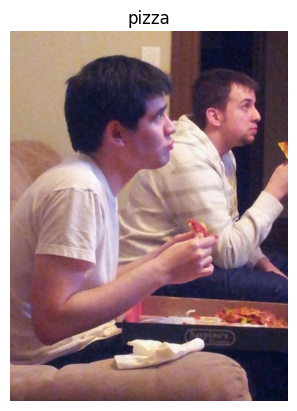

In [ ]:
# View a random image from the training dataset
img = view_random_image("pizza_steak/train", "pizza")

In [ ]:
img
# Convert it into a tensor
import tensorflow as tf
img_ = tf.constant(img)
img_

<tf.Tensor: shape=(512, 384, 3), dtype=uint8, numpy=
array([[[189, 166, 134],
        [188, 165, 134],
        [189, 165, 137],
        ...,
        [ 59,  37,  49],
        [ 59,  37,  49],
        [ 59,  37,  49]],

       [[189, 166, 134],
        [189, 166, 135],
        [189, 165, 137],
        ...,
        [ 61,  39,  51],
        [ 62,  40,  52],
        [ 63,  41,  53]],

       [[190, 167, 135],
        [189, 166, 134],
        [189, 166, 135],
        ...,
        [ 62,  40,  52],
        [ 64,  42,  54],
        [ 65,  43,  55]],

       ...,

       [[100,  67,  52],
        [ 99,  65,  53],
        [ 98,  64,  54],
        ...,
        [ 13,  10,  37],
        [ 13,  10,  37],
        [ 14,  11,  38]],

       [[ 99,  67,  52],
        [ 97,  65,  52],
        [ 97,  63,  53],
        ...,
        [ 11,   8,  35],
        [ 11,   8,  35],
        [ 15,  12,  39]],

       [[ 99,  67,  52],
        [ 97,  65,  50],
        [ 94,  62,  49],
        ...,
        [ 10,   7,  3

In [ ]:
# View the image shape
img.shape # returns width, height, colour channels

(512, 384, 3)

🔑 **Note:** As we've discussed before, many machine learning models, including neural networks prefer the values they work with to be between 0 and 1. Knowing this, one of the most common preprocessing steps for working with images is to **scale** (also referred to as **normalize**) their pixel values by dividing the image arrays by 255. (since 255 is the maximum pixel value). 

In [ ]:
# Get all the pixel values between 0 & 1
img/255.

array([[[0.74117647, 0.65098039, 0.5254902 ],
        [0.7372549 , 0.64705882, 0.5254902 ],
        [0.74117647, 0.64705882, 0.5372549 ],
        ...,
        [0.23137255, 0.14509804, 0.19215686],
        [0.23137255, 0.14509804, 0.19215686],
        [0.23137255, 0.14509804, 0.19215686]],

       [[0.74117647, 0.65098039, 0.5254902 ],
        [0.74117647, 0.65098039, 0.52941176],
        [0.74117647, 0.64705882, 0.5372549 ],
        ...,
        [0.23921569, 0.15294118, 0.2       ],
        [0.24313725, 0.15686275, 0.20392157],
        [0.24705882, 0.16078431, 0.20784314]],

       [[0.74509804, 0.65490196, 0.52941176],
        [0.74117647, 0.65098039, 0.5254902 ],
        [0.74117647, 0.65098039, 0.52941176],
        ...,
        [0.24313725, 0.15686275, 0.20392157],
        [0.25098039, 0.16470588, 0.21176471],
        [0.25490196, 0.16862745, 0.21568627]],

       ...,

       [[0.39215686, 0.2627451 , 0.20392157],
        [0.38823529, 0.25490196, 0.20784314],
        [0.38431373, 0

## An end-to-end example

Let's build a convolutional neural network to find patterns in our images, more specifically we need a way to:

* Load our images
* Preprocess our images 
* Build a CNN to find patterns in our images 
* Compile our CNN
* Fit the CNN to our training data 

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Setup path to our data directories
train_dir = "pizza_steak/train"
test_dir = "pizza_steak/test"

In [ ]:
# Set the seed
tf.random.set_seed(42)

# Preprocess data (get all of the pixel values between 0 & 1, also called scaling/normalization)
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

# Setup path to our data directories
train_dir = "pizza_steak/train"
test_dir = "pizza_steak/test"

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224), # From 512 to 224
                                               class_mode="binary",
                                               seed=42) 

valid_data = valid_datagen.flow_from_directory(test_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               seed=42)

# Build a CNN model (same as the Tiny VGG on the CNN explainer website), pattern is 2 conv layers and a maxpool layer
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

# Compile our CNN
model_1.compile(loss="binary_crossentropy",
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=["accuracy"]
                 )

# Fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data), #len = 47
                        validation_data=valid_data,
                        validation_steps=len(valid_data)   
)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5
47/47 [==============================] - 24s 260ms/step - loss: 0.6222 - accuracy: 0.6520 - val_loss: 0.4718 - val_accuracy: 0.7880
Epoch 2/5
47/47 [==============================] - 11s 236ms/step - loss: 0.4554 - accuracy: 0.7960 - val_loss: 0.3625 - val_accuracy: 0.8420
Epoch 3/5
47/47 [==============================] - 12s 249ms/step - loss: 0.4344 - accuracy: 0.8060 - val_loss: 0.4459 - val_accuracy: 0.7960
Epoch 4/5
47/47 [==============================] - 12s 262ms/step - loss: 0.3693 - accuracy: 0.8360 - val_loss: 0.3280 - val_accuracy: 0.8620
Epoch 5/5
47/47 [==============================] - 11s 224ms/step - loss: 0.3123 - accuracy: 0.8687 - val_loss: 0.3262 - val_accuracy: 0.8600


> 🔑 **Note:** if the above cell is taking longer than ~10 sec per epochs, make sure you are using a GPU. 

In [ ]:
# Get a model summary()
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

🛠 **Practice/exercice:** Go through the CNN explainer website for a minimum of 10 minutes and compare our neural network with theirs: [CNN Explainer](https://poloclub.github.io/cnn-explainer/)

## Using the same model as before

## Using the same model as before

Let's replicate the model we've built in a previous section to see if it works with our image data.

The model we're building is from the [TensorFlow playground](https://playground.tensorflow.org/#activation=relu&batchSize=10&dataset=circle&regDataset=reg-plane&learningRate=0.001&regularizationRate=0&noise=0&networkShape=4,4&seed=0.89644&showTestData=false&discretize=false&percTrainData=50&x=true&y=true&xTimesY=false&xSquared=false&ySquared=false&cosX=false&sinX=false&cosY=false&sinY=false&collectStats=false&problem=classification&initZero=false&hideText=false)


In [ ]:
# Set the random set
tf.random.set_seed(42)

# Create a model to replicate the TensorFlow Playground model
model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

# Compile our model
model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"] 
                )

# Fit the model
history_2 = model_2.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=valid_data,
            validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 15s 276ms/step - loss: 1.8301 - accuracy: 0.4987 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 12s 254ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 11s 227ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 11s 230ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 11s 226ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000


In [ ]:
# Get a summary of model_2
model_2.summary() 

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 4)                 602116    
                                                                 
 dense_2 (Dense)             (None, 4)                 20        
                                                                 
 dense_3 (Dense)             (None, 1)                 5         
                                                                 
Total params: 602,141
Trainable params: 602,141
Non-trainable params: 0
_________________________________________________________________


Despite having 20x more parmeters than our CNN (model_1), model_2 performs terribly... let's try to improve it.

In [ ]:
# Try to improve the previous model
# Set the random set
tf.random.set_seed(42)

# Create a model to replicate the TensorFlow Playground model
model_3 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

# Compile our model
model_3.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"] 
                )

# Fit the model
history_3 = model_3.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=valid_data,
            validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 12s 201ms/step - loss: 1.9791 - accuracy: 0.6433 - val_loss: 0.4479 - val_accuracy: 0.8020
Epoch 2/5
47/47 [==============================] - 10s 225ms/step - loss: 0.8684 - accuracy: 0.7000 - val_loss: 1.8158 - val_accuracy: 0.5240
Epoch 3/5
47/47 [==============================] - 11s 232ms/step - loss: 0.6578 - accuracy: 0.7493 - val_loss: 0.6568 - val_accuracy: 0.6840
Epoch 4/5
47/47 [==============================] - 9s 195ms/step - loss: 0.5161 - accuracy: 0.7640 - val_loss: 0.5112 - val_accuracy: 0.7500
Epoch 5/5
47/47 [==============================] - 10s 220ms/step - loss: 0.5879 - accuracy: 0.7593 - val_loss: 0.7248 - val_accuracy: 0.7000


In [ ]:
# Get a summary of model_3
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               15052900  
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 100)               10100     
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


🔑 **Note:** you can think of trainable paramaters as **patterns a model can learn from data**. Intuitively, you might think more is better. And in lots of cases, it is. But in this case, the difference here is the two different styles of model we're using. Where a serie of dense layers has a number of different learnable parameters connected to each other and hence a higher number of possible learnable patterns, a **convolutionnal neural network seeks to sort out and learn the most important patterns in a image.** So even these are less learnable parameters in our convolutionnal neural network, these are often more helpful in dechiphering between features in an image.

## Binary classification: let's break it down

1. Become one with the data (visualize, visualize, visualize).
2. Preprocess the data (prepared it for our model, the main step here was scaling/normalizing).
3. Created a model (start with a baseline)
4. Fit the model
5. Evaluate the model.
6. Adjust different parameters and improve the model (try to beat our baseline)
7. Repeat until satisfied (experiment, experiment, experiment)

### 1. Become one with the data

['1853564.jpg']
Image shape: (384, 512, 3)
['179165.jpg']
Image shape: (512, 382, 3)


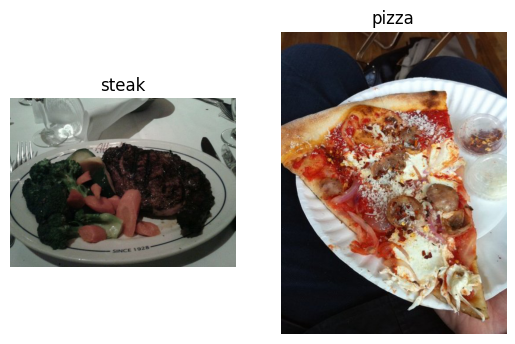

In [ ]:
# Visualize data
plt.figure()
plt.subplot(1, 2, 1)
steak_img = view_random_image("pizza_steak/train", "steak")
plt.subplot(1, 2, 2)
pizza_img = view_random_image("pizza_steak/train", "pizza")

### 2. Preprocess the data

In [ ]:
# Define directory dataset paths
train_dir = "pizza_steak/train"
test_dir = "pizza_steak/test"

Our next step is to turn our data into **batches**.

A batch is a small subset of data. Rather than look at all ~10,000 images at one time, a model might only look at 32 at a time.

It does this for a couple of reasons:
1. 10,000 images (or more) might not fit into the memory of your processor (GPU)
2. Trying to learn the patterns in 10,000 in one hit could result in the model not being able to learn very well.

In [ ]:
!nvidia-smi

Sat Apr 29 07:55:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P0    29W /  70W |   2911MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from numpy.ma.core import reshape
# Create, train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

In [ ]:
# Load in our image data from directories and turn them into batches
train_data = train_datagen.flow_from_directory(directory=train_dir, 
                                               target_size=(224, 224),
                                               class_mode="binary")

test_data = test_datagen.flow_from_directory(directory=test_dir,
                                               target_size=(224, 224),
                                               class_mode="binary")

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
# Get a sample of a train data batch
images, labels = train_data.next() # Get the next batch of images/labels in train_data
len(images), len(labels)

(32, 32)

In [ ]:
# How many batches are there ?
len(train_data)

47

In [ ]:
import matplotlib.pyplot as plt
import random
# Create a function for viewing images in a data batch
def show_batches_images(images, labels, augmented_images=None, augmented_label=None):
  """
  Displays a plot of random images and their labels from a data batch.
  """
  i = random.choice(range(len(images)))
  j = random.choice(range(len(images)))
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Create subplots (5 rows, 5 columns)
  plt.subplot(1, 2, 1)
  # Display an image
  plt.imshow(images[i])
  print("Showing image number:{}".format(i))
  # Add the image label as the title
  if (len(labels[0]) == 1):
    plt.title(class_names[int(tf.round(labels[i]))])
  else:
    plt.title(class_names[labels[i].argmax()])
  # Turn the grid lines off
  plt.axis("off")
  # Create subplots (5 rows, 5 columns)
  plt.subplot(1, 2, 2)
  # Display an image
  plt.imshow(images[j])
  print("Showing image number:{}".format(j))
  # Add the image label as the title
  if (len(labels[0]) == 1):
    plt.title(class_names[int(tf.round(labels[j]))])
  else:
    plt.title(class_names[labels[j].argmax()])
  # Turn the grid lines off
  plt.axis("off")

  if (augmented_images is not None):
    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Create subplots (5 rows, 5 columns)
    plt.subplot(1, 2, 1)
    # Display an image
    plt.imshow(augmented_images[i])
    print("Showing augmented image number:{}".format(i))
    # Add the image label as the title
    if (len(labels[0]) == 1):
      plt.title(class_names[int(tf.round(augmented_labels[i]))])
    else:
      plt.title(class_names[augmented_labels[i].argmax()])
      # Turn the grid lines off
      plt.axis("off")
      # Create subplots (5 rows, 5 columns)
      plt.subplot(1, 2, 2)
      # Display an image
      plt.imshow(augmented_images[j])
      print("Showing augmented image number:{}".format(j))
      # Add the image label as the title
    if (len(labels[0]) == 1):
      plt.title(class_names[int(tf.round(augmented_labels[j]))])
    else:
      plt.title(class_names[augmented_labels[j].argmax()])
      # Turn the grid lines off
      plt.axis("off")

Showing image number:14
Showing image number:7


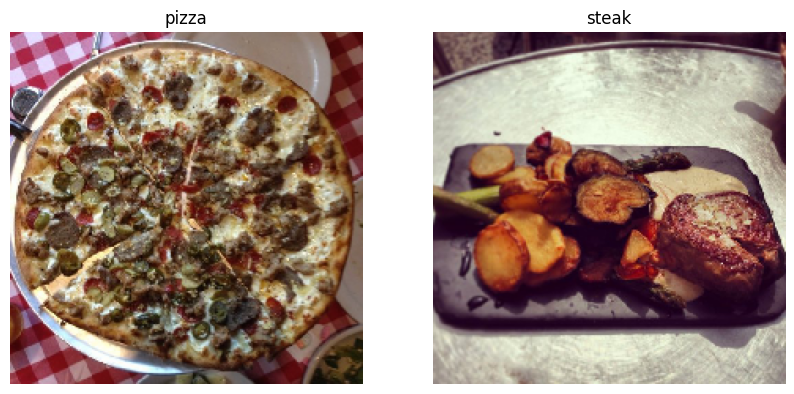

In [ ]:
show_batches_images(images, labels)

In [ ]:
# Get the first two images
images[:2], images[0].shape

(array([[[[0.47058827, 0.40784317, 0.34509805],
          [0.4784314 , 0.427451  , 0.3647059 ],
          [0.48627454, 0.43529415, 0.37254903],
          ...,
          [0.8313726 , 0.70980394, 0.48627454],
          [0.8431373 , 0.73333335, 0.5372549 ],
          [0.87843144, 0.7725491 , 0.5882353 ]],
 
         [[0.50980395, 0.427451  , 0.36078432],
          [0.5058824 , 0.42352945, 0.35686275],
          [0.5137255 , 0.4431373 , 0.3647059 ],
          ...,
          [0.82745105, 0.7058824 , 0.48235297],
          [0.82745105, 0.70980394, 0.5058824 ],
          [0.8431373 , 0.73333335, 0.5372549 ]],
 
         [[0.5254902 , 0.427451  , 0.34901962],
          [0.5372549 , 0.43921572, 0.36078432],
          [0.5372549 , 0.45098042, 0.36078432],
          ...,
          [0.82745105, 0.7019608 , 0.4784314 ],
          [0.82745105, 0.7058824 , 0.49411768],
          [0.8352942 , 0.7176471 , 0.5137255 ]],
 
         ...,
 
         [[0.77647066, 0.5647059 , 0.2901961 ],
          [0.78039

### 3. Create a CNN model (start with a baseline)

A baseline is a relatively simple model or existing result that you setup when beginning a machine learning model experiment and then as you keep experimenting, you try to beat the baseline.

> 🔑 **Note:** In deep learning, there is almost an infinite amount of architectures you could create. So one of the best ways to get started is to start with something simple and see if it works on your data and then introduce complexity as required (e.g look at which current model is performing best in the field for your problem). 

In [ ]:
# Make the creating of our model a little easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [ ]:
# Create the model (this will be our baseline, a layer convolutional neural network)
model_4 = Sequential([
    Conv2D(filters=10, # filter is the number of sliding windows going across an input (higher= more complex model)
           kernel_size=3, # Size of sliding window going across an input
           strides=1, # Stride is the step the slidings window takes across an input
           padding="valid", # If "same", output shape is same as input shape if "valid" shape get compressed
           activation="relu",
           input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation="relu"),
    Conv2D(10, 3, activation="relu"),
    Flatten(),
    Dense(1, activation="sigmoid")
])

In [ ]:
# Check to make sure we're still running on a GPU
import tensorflow as tf
print("GPU", "available (YESSSSS !!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


🛠 **Practice:** Understand what's going on in a 2D layer by going through  [CNN Explainer](https://poloclub.github.io/cnn-explainer/) 

In [ ]:
# Compile the model 
model_4.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

In [ ]:
# Get a summary of our model
model_4.summary()
# padding has reduced the output shape, and it reduces again for each layer

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_3 (Flatten)         (None, 475240)            0         
                                                                 
 dense_8 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


## Saving and reloading a trained model

In [ ]:
import os, datetime, pytz
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  tz = pytz.timezone('Europe/Paris')
  modeldir = os.path.join("/content/drive/MyDrive/pizza_steak/save",
                          datetime.datetime.now().astimezone(tz).strftime("%d%m%Y-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
import tensorflow_hub as hub
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer":hub.KerasLayer}) # first layer
  return model

### TensorBoard CallBack

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to our directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard`magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  tz = pytz.timezone('Europe/Paris')
  logdir = os.path.join("logs",
                      datetime.datetime.now().astimezone(tz).strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### 4. Fit the model
 

In [ ]:
# Check lenghts of training and test data generators
len(train_data), len(test_data)

(47, 16)

In [ ]:
# Fit the model
# Create new TensorBoard session everytime we train a model
tensorboard_callback = create_tensorboard_callback()

history_4 = model_4.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[tensorboard_callback])

Epoch 1/5
47/47 [==============================] - 14s 235ms/step - loss: 0.9479 - accuracy: 0.6160 - val_loss: 0.4644 - val_accuracy: 0.7880
Epoch 2/5
47/47 [==============================] - 11s 234ms/step - loss: 0.4696 - accuracy: 0.7900 - val_loss: 0.4598 - val_accuracy: 0.7880
Epoch 3/5
47/47 [==============================] - 11s 227ms/step - loss: 0.3601 - accuracy: 0.8540 - val_loss: 0.3580 - val_accuracy: 0.8400
Epoch 4/5
47/47 [==============================] - 11s 236ms/step - loss: 0.2491 - accuracy: 0.9060 - val_loss: 0.3604 - val_accuracy: 0.8460
Epoch 5/5
47/47 [==============================] - 14s 306ms/step - loss: 0.1402 - accuracy: 0.9573 - val_loss: 0.3941 - val_accuracy: 0.8360


In [ ]:
save_model(model_4, "model_4")

Saving model to: /content/drive/MyDrive/pizza_steak/save/29042023-095655-model_4.h5...


'/content/drive/MyDrive/pizza_steak/save/29042023-095655-model_4.h5'

### 5. Evaluating our model

It looks like our model is learning something, let's evaluate it. 

In [ ]:
model_1.evaluate(test_data)

16/16 [==============================] - 3s 161ms/step - loss: 0.3262 - accuracy: 0.8600


[0.32615381479263306, 0.8600000143051147]

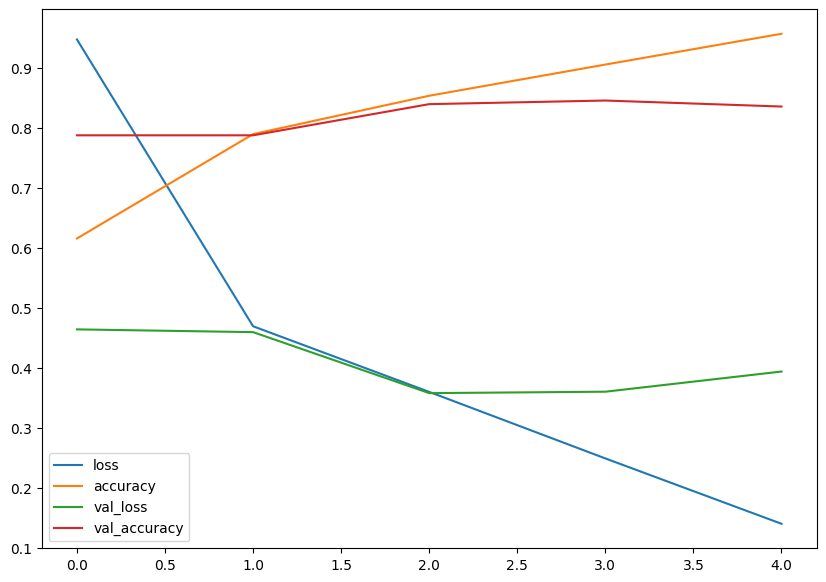

In [ ]:
import pandas as pd 
pd.DataFrame(history_4.history).plot(figsize=(10, 7));

In [ ]:
!git clone https://github.com/JoachimLombardi/Helper_functions.git

Cloning into 'Helper_functions'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 18 (delta 4), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (18/18), 4.61 KiB | 944.00 KiB/s, done.


In [ ]:
# Plot the validation and training curves seperately
from Helper_functions.plot_loss_curves import plot_loss_curves

> 🔑 **Note:** When a model's **validation loss starts to increase**, it's likely that the model is **overfitting** the training dataset. Model is overfitting when validation loss is going up.

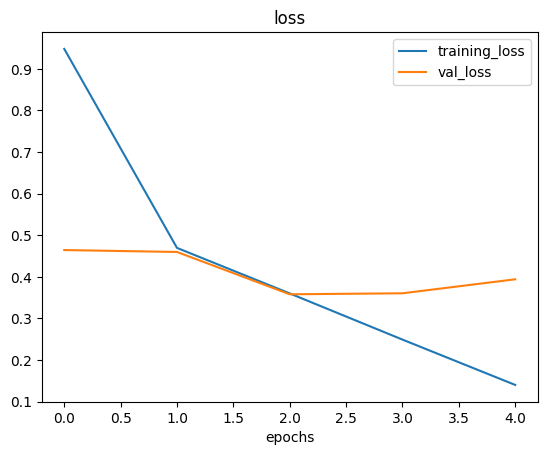

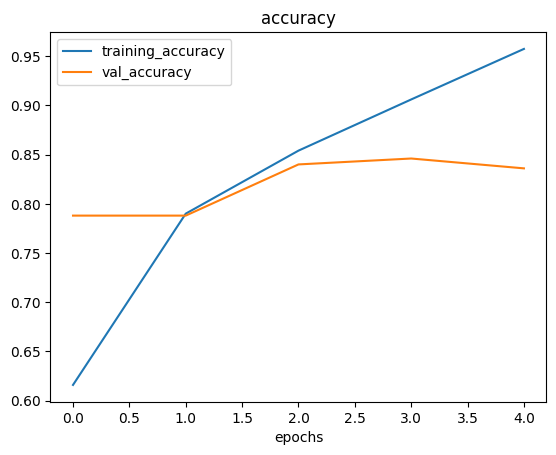

In [ ]:
# Check out the loss and accuracy of model_4
plot_loss_curves(history_4)

### Checking the TensorBoard logs 

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### 6. Adjust the model parameters

Fitting a machine learning model comes in 3 steps:

0. Create a baseline
1. Beat the baseline by overfitting a larger model
2. Reduce overfitting

Ways to induce overfitting:

* Increase the number of convolutionnal layers
* Increase the number of convolutionnal filters
* Add another Dense layer to the output of our flattened layer

Reduce overfitting:
* Add data augmentation
* Add regularization layers (such as MaxPool2D)
* Add more data...

> 🔑 **Note:** Reducing overfitting is also known as **regularization**

In [ ]:
# Create the model (this is going to be our new baseline)
model_5 = Sequential([
    Conv2D(10, 
           3, 
           activation="relu",
           input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2), # On prend la valeur maximale de chaque fenêtre de pixel, the most important part
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")         
])

In [ ]:
# Let's compile the model
model_5.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

In [ ]:
# Fit the model
history_5 = model_5.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data) 
)

Epoch 1/5
47/47 [==============================] - 13s 212ms/step - loss: 0.6042 - accuracy: 0.6673 - val_loss: 0.4731 - val_accuracy: 0.7860
Epoch 2/5
47/47 [==============================] - 11s 228ms/step - loss: 0.4897 - accuracy: 0.7647 - val_loss: 0.4457 - val_accuracy: 0.7940
Epoch 3/5
47/47 [==============================] - 11s 227ms/step - loss: 0.4328 - accuracy: 0.8093 - val_loss: 0.3624 - val_accuracy: 0.8580
Epoch 4/5
47/47 [==============================] - 12s 259ms/step - loss: 0.3918 - accuracy: 0.8300 - val_loss: 0.3548 - val_accuracy: 0.8360
Epoch 5/5
47/47 [==============================] - 10s 204ms/step - loss: 0.3625 - accuracy: 0.8447 - val_loss: 0.3415 - val_accuracy: 0.8740


In [ ]:
# Get a summary of our model with maxpooling
model_5.summary()
# Comme on prend les pixels deux par deux et qu'on garde seulement le max ça réduit la taille des images par 2

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 10)      

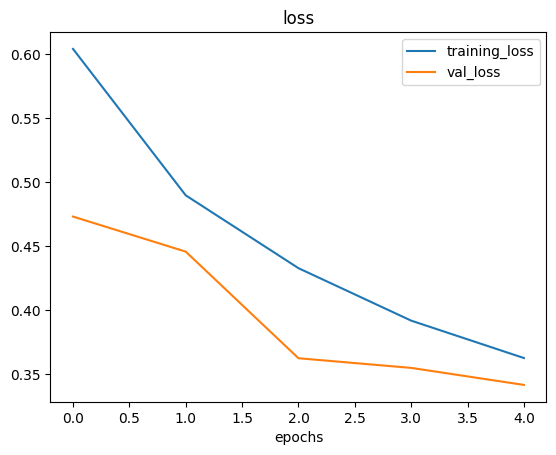

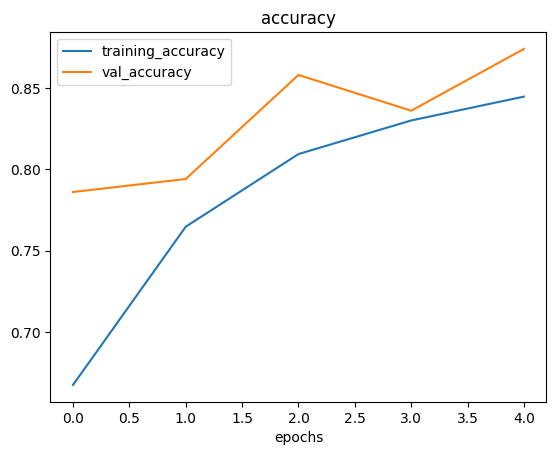

In [ ]:
# Plots loss curves
plot_loss_curves(history_5)

### Opening our bag of tricks and finding data augmentation


In [ ]:
# Create ImageDataGenerator training instance with data augmentation 
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                              rotation_range=0.2,
                                              shear_range=0.4,
                                              zoom_range=0.1,
                                              width_shift_range=0.2,
                                              height_shift_range=0.3,
                                              horizontal_flip=True)

# Create ImageDataGenerator without data augmentation
train_datagen = ImageDataGenerator(rescale=1/255.)

# Create ImageDataGenerator without data augmentation for the test dataset
test_datagen = ImageDataGenerator(rescale=1/255.)

> 🤔 **Question:** What is data augmentation ?

Data augmentation is the process of altering our training data, leading it to have more diversity and in turn allowing our models to learn more generalizable (hopefully) patterns.

Altering might mean adjusting the rotation of an image, flipping it, cropping it or something similar.

Let's write some code to visualize data augmentation...

In [ ]:
# Import data and augment it for training directory
print("Augmented training data:")
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224, 224),
                                                                   class_mode="binary",
                                                                   shuffle=False) # For demonstration purposes only
# Create non-augmented trained data batches
print("Non-augmented training data:")
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224, 224),
                                               class_mode="binary", 
                                               shuffle=False)

# Create non-augmented test databatches
print("Non-augmented testing data:")
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224, 224),
                                             class_mode="binary",
                                             shuffle=False)

Augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented testing data:
Found 500 images belonging to 2 classes.


> 🔑 **Note:** Data augmentation is usually only performed on the training data. Using `ImageDataGenerator` built-in data augmentation parameters our images are left as they are in the directories but are modified as they're loaded into the model.

Finally...let's visualize some augmented data!!!

In [ ]:
# Get sampled data batches
images, labels =  train_data.next()
augmented_images, augmented_labels = train_data_augmented.next() # note: labels aren't augmented... only data (images)

In [ ]:
# show original image and augmented image

Showing image number:24
Showing image number:25


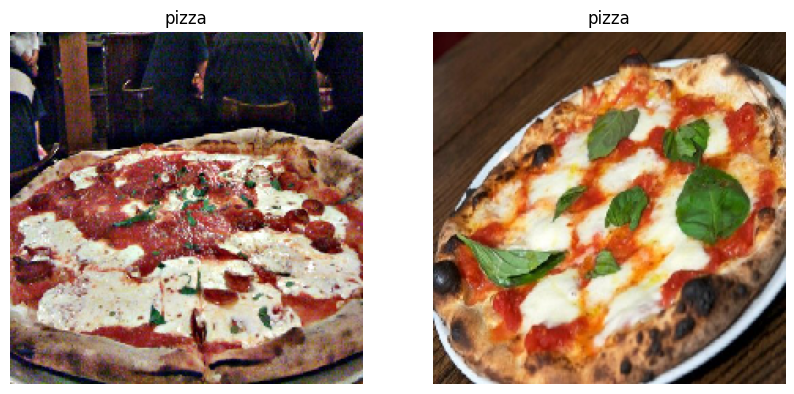

In [ ]:
show_batches_images(images, labels)

Showing image number:1
Showing image number:22
Showing augmented image number:1
Showing augmented image number:22


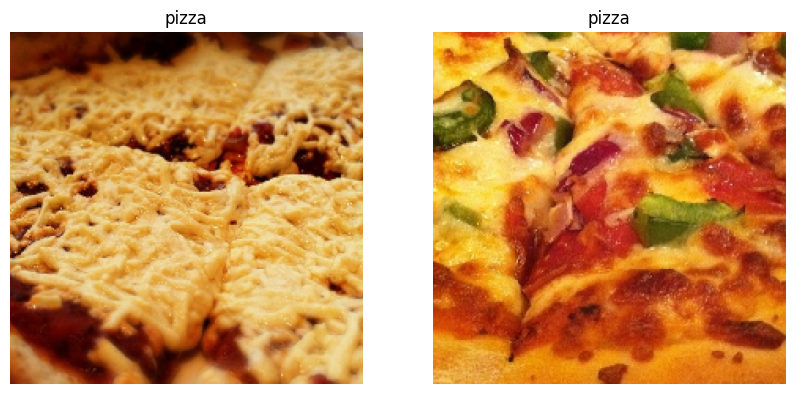

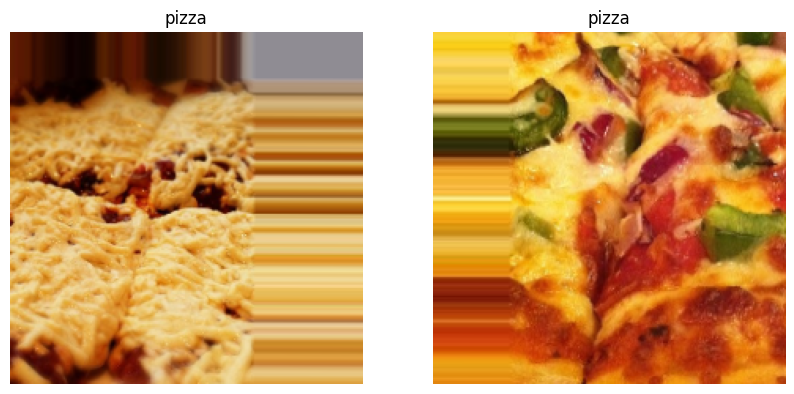

In [ ]:
show_batches_images(images, labels, augmented_images, augmented_labels)

Now we've seen what augmented training data looks like, let's build a model and see how it learns on augmented data.

In [ ]:
# Create a model (same as model_5)
model_6 = Sequential([
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

# Compile the model
model_6.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

# Fit the model
history_6 = model_6.fit(train_data_augmented, # fitting model_6 on augmented training data
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 33s 668ms/step - loss: 0.7043 - accuracy: 0.3967 - val_loss: 0.6930 - val_accuracy: 0.5040
Epoch 2/5
47/47 [==============================] - 28s 594ms/step - loss: 0.6931 - accuracy: 0.5053 - val_loss: 0.6922 - val_accuracy: 0.5920
Epoch 3/5
47/47 [==============================] - 27s 580ms/step - loss: 0.6930 - accuracy: 0.5567 - val_loss: 0.6888 - val_accuracy: 0.5220
Epoch 4/5
47/47 [==============================] - 29s 616ms/step - loss: 0.6935 - accuracy: 0.5353 - val_loss: 0.6907 - val_accuracy: 0.6320
Epoch 5/5
47/47 [==============================] - 28s 598ms/step - loss: 0.6904 - accuracy: 0.5953 - val_loss: 0.6831 - val_accuracy: 0.5980


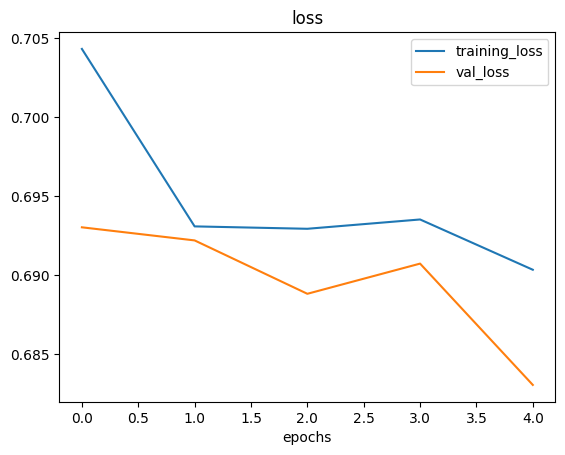

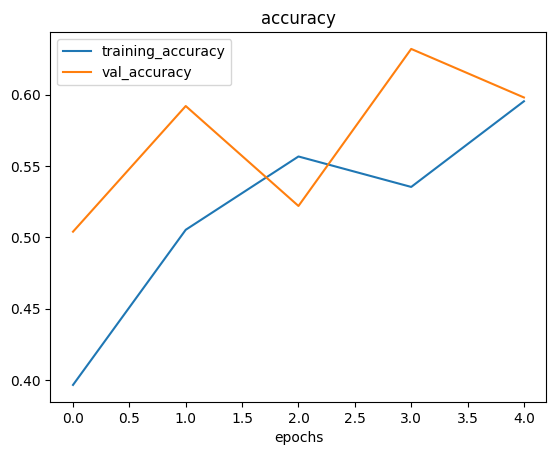

In [ ]:
# Check our models training curves
plot_loss_curves(history_6)

Let's shuffle our augmented training data and train another model (the same as model_6) on it and see what happens.

In [ ]:
# Train with shuffled data
train_data_augmented_shuffled = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224, 224),
                                                                   class_mode="binary") # For demonstration purposes only
                                                                  
# Create non-augmented trained data batches
print("Non-augmented training data:")
train_data_shuffled = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224, 224),
                                               class_mode="binary")

# Create non-augmented test databatches
print("Non-augmented testing data:")
test_data_shuffled = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224, 224),
                                             class_mode="binary")

Found 1500 images belonging to 2 classes.
Non-augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented testing data:
Found 500 images belonging to 2 classes.


In [ ]:
# Create a model (same as model_6)
model_7 = Sequential([
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

# Compile the model
model_7.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

# Fit the model
history_7 = model_7.fit(train_data_augmented_shuffled, # fitting model_6 on augmented training data
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data_shuffled,
                        validation_steps=len(test_data_shuffled))

Epoch 1/5
47/47 [==============================] - 27s 549ms/step - loss: 0.6770 - accuracy: 0.5513 - val_loss: 0.6195 - val_accuracy: 0.6240
Epoch 2/5
47/47 [==============================] - 27s 573ms/step - loss: 0.5694 - accuracy: 0.7087 - val_loss: 0.4878 - val_accuracy: 0.7880
Epoch 3/5
47/47 [==============================] - 27s 576ms/step - loss: 0.5100 - accuracy: 0.7567 - val_loss: 0.4069 - val_accuracy: 0.8220
Epoch 4/5
47/47 [==============================] - 27s 575ms/step - loss: 0.5076 - accuracy: 0.7560 - val_loss: 0.4717 - val_accuracy: 0.7640
Epoch 5/5
47/47 [==============================] - 28s 602ms/step - loss: 0.5060 - accuracy: 0.7533 - val_loss: 0.3657 - val_accuracy: 0.8380


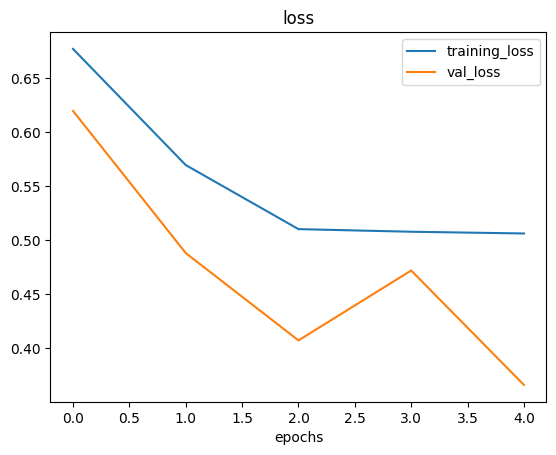

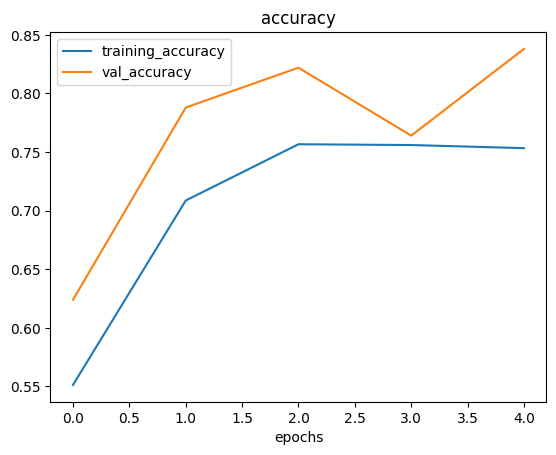

In [ ]:
# Plot loss curves
plot_loss_curves(history_7)

> 🔑 **Note:** When shuffling training data, the model gets exposed to all different kinds of data training, thus enabling it to learn features across a wide array of images (in our case, pizza & steak at the same time instead of just pizza then steak).  

### 7. Repeat until satisfied

Since we've already beaten our baseline, there are a few things we could try to continue to improve our model:

* Increase the numbers of model layers (e.g add more `Conv2D`/ `MaxPool2D` layers).
* Increase the numbers of filters in each convolutional layer (e.g from 10 to 32 or even 64).
* Train for longer (more epochs)
* Find an ideal learning rate
* Get more data (give the model more opportunities to learn)
* Uses **transfer learning** to leverage what another image model has learned and adjust it for our own use case.

> 🛠 **Practice:** Recreate the model on the CNN explainer website (same as `model_1` and see how it performs on the augmented shuffled training data.

In [ ]:
# Create the model
model_8 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(2, padding="valid"),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(2),
    Flatten(),
    Dense(1, activation="sigmoid")
])

# Complile the model
model_8.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

# Fit the model
history_8 = model_8.fit(train_data_augmented_shuffled,
                        epochs=10,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data_shuffled,
                        validation_steps=len(test_data_shuffled))

Epoch 1/10
47/47 [==============================] - 41s 777ms/step - loss: 0.6611 - accuracy: 0.6040 - val_loss: 0.5268 - val_accuracy: 0.8240
Epoch 2/10
47/47 [==============================] - 30s 638ms/step - loss: 0.5346 - accuracy: 0.7307 - val_loss: 0.3941 - val_accuracy: 0.8540
Epoch 3/10
47/47 [==============================] - 32s 688ms/step - loss: 0.4956 - accuracy: 0.7607 - val_loss: 0.3922 - val_accuracy: 0.8260
Epoch 4/10
47/47 [==============================] - 31s 655ms/step - loss: 0.5154 - accuracy: 0.7433 - val_loss: 0.3933 - val_accuracy: 0.8300
Epoch 5/10
47/47 [==============================] - 27s 582ms/step - loss: 0.4946 - accuracy: 0.7680 - val_loss: 0.3478 - val_accuracy: 0.8520
Epoch 6/10
47/47 [==============================] - 33s 716ms/step - loss: 0.4796 - accuracy: 0.7713 - val_loss: 0.3663 - val_accuracy: 0.8660
Epoch 7/10
47/47 [==============================] - 31s 657ms/step - loss: 0.4665 - accuracy: 0.7740 - val_loss: 0.4859 - val_accuracy: 0.7720

In [ ]:
# # Create a learning rate callback
# lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20))

# # Create the model
# model_9 = Sequential([
#     Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
#     Conv2D(32, 3, activation="relu"),
#     MaxPool2D(2, padding="valid"),
#     Conv2D(32, 3, activation="relu"),
#     Conv2D(32, 3, activation="relu"),
#     MaxPool2D(2),
#     Flatten(),
#     Dense(1, activation="sigmoid")
# ])

# # Complile the model
# model_9.compile(loss="binary_crossentropy",
#                 optimizer=Adam(),
#                 metrics=["accuracy"])

# # Fit the model
# history_9 = model_9.fit(train_data_augmented_shuffled,
#                         epochs=100,
#                         steps_per_epoch=len(train_data_augmented_shuffled),
#                         validation_data=test_data_shuffled,
#                         validation_steps=len(test_data_shuffled),
#                         callbacks=[lr_scheduler])

Epoch 1/100
47/47 [==============================] - 30s 608ms/step - loss: 0.6504 - accuracy: 0.6413 - val_loss: 0.5564 - val_accuracy: 0.7280 - lr: 1.0000e-04
Epoch 2/100
47/47 [==============================] - 28s 599ms/step - loss: 0.5678 - accuracy: 0.7027 - val_loss: 0.4767 - val_accuracy: 0.7700 - lr: 1.1220e-04
Epoch 3/100
47/47 [==============================] - 28s 604ms/step - loss: 0.5263 - accuracy: 0.7420 - val_loss: 0.4809 - val_accuracy: 0.7540 - lr: 1.2589e-04
Epoch 4/100
47/47 [==============================] - 27s 585ms/step - loss: 0.5021 - accuracy: 0.7587 - val_loss: 0.4180 - val_accuracy: 0.8060 - lr: 1.4125e-04
Epoch 5/100
47/47 [==============================] - 26s 563ms/step - loss: 0.4788 - accuracy: 0.7787 - val_loss: 0.3484 - val_accuracy: 0.8460 - lr: 1.5849e-04
Epoch 6/100
47/47 [==============================] - 28s 596ms/step - loss: 0.4957 - accuracy: 0.7513 - val_loss: 0.3639 - val_accuracy: 0.8380 - lr: 1.7783e-04
Epoch 7/100
47/47 [===============

KeyboardInterrupt: ignored

In [ ]:
# # Plot the learning rate value vs the loss
# plt.figure(figsize=(15,5))
# plt.semilogx(history_9.history["lr"],
#              history_9.history['loss'])
# plt.xlabel("Learning Rate")
# plt.ylabel("Loss")
# plt.title("Learning rate vs. Loss")

NameError: ignored

<Figure size 1500x500 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
# Make the creating of our model a little easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [ ]:
# Create early stopping callback
def create_early_stopping(monitor_, patience_):
  early_stopping_ = tf.keras.callbacks.EarlyStopping(monitor=monitor_,
                                                    patience=patience_)
  return early_stopping_

In [ ]:
# Model with learning rate of 0.0015

early_stopping = create_early_stopping("val_accuracy", 3)

# Create the model
model_10 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(2, padding="valid"),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(2),
    Flatten(),
    Dense(1, activation="sigmoid")
])

# Complile the model
model_10.compile(loss="binary_crossentropy",
                optimizer=Adam(learning_rate=0.0015),
                metrics=["accuracy"])

# Fit the model
history_10 = model_10.fit(train_data_augmented_shuffled,
                        epochs=100,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data_shuffled,
                        validation_steps=len(test_data_shuffled),
                        callbacks=[early_stopping])

Epoch 1/100
47/47 [==============================] - 38s 761ms/step - loss: 0.6620 - accuracy: 0.5973 - val_loss: 0.5002 - val_accuracy: 0.7360
Epoch 2/100
47/47 [==============================] - 32s 682ms/step - loss: 0.5326 - accuracy: 0.7393 - val_loss: 0.4153 - val_accuracy: 0.8200
Epoch 3/100
47/47 [==============================] - 31s 645ms/step - loss: 0.5310 - accuracy: 0.7580 - val_loss: 0.3784 - val_accuracy: 0.8520
Epoch 4/100
47/47 [==============================] - 26s 550ms/step - loss: 0.5013 - accuracy: 0.7700 - val_loss: 0.4109 - val_accuracy: 0.8520
Epoch 5/100
47/47 [==============================] - 30s 630ms/step - loss: 0.5006 - accuracy: 0.7773 - val_loss: 0.4190 - val_accuracy: 0.8040
Epoch 6/100
47/47 [==============================] - 28s 594ms/step - loss: 0.4702 - accuracy: 0.7893 - val_loss: 0.3461 - val_accuracy: 0.8260


In [ ]:
save_model(model_10, "model_data_augmented_shuffled_tuned")

Saving model to: /content/drive/MyDrive/pizza_steak/save/29042023-101747-model_data_augmented_shuffled_tuned.h5...


'/content/drive/MyDrive/pizza_steak/save/29042023-101747-model_data_augmented_shuffled_tuned.h5'

# Making a prediction with our trained model on our own custom data


--2023-04-29 08:17:47--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg’

03-steak.jpeg       100%[===================>]   1.89M  --.-KB/s    in 0.02s   

2023-04-29 08:17:47 (87.0 MB/s) - ‘03-steak.jpeg’ saved [1978213/1978213]



(-0.5, 3023.5, 4031.5, -0.5)

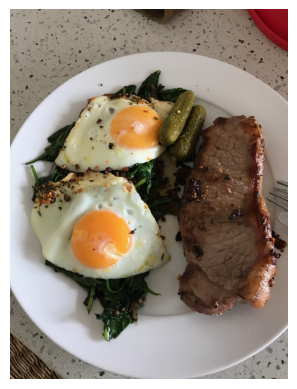

In [ ]:
# View our example image
import matplotlib.image as mpimg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
steak = mpimg.imread("03-steak.jpeg")
plt.imshow(steak)
plt.axis(False)

In [ ]:
# Check the shape of our image
steak.shape

(4032, 3024, 3)

> 🔑 **Note:** When you train a neural network and you want to make a prediction with it on your own custom data, it's important that your custom data (or new data) is preprocessed into the same format as the data your model was trained on.

## Turn into a batch

In [ ]:
# Create a function to import an image and resize it to be able to be used with our model
# Create ImageDataGenerator without data augmentation
train_datagen = ImageDataGenerator(rescale=1/255.)

# Create non-augmented trained data batches
print("Non-augmented training data:")
train_data = train_datagen.flow_from_directory("drive/MyDrive/pizza_steak",
                                               target_size=(224, 224),
                                               class_mode="binary")

Non-augmented training data:
Found 4 images belonging to 3 classes.


## Make prediction

1/1 [==============================] - 1s 760ms/step
[[0.95149326]
 [0.8535201 ]
 [0.01503526]
 [0.31370294]]


array([1., 1., 1., 1.], dtype=float32)

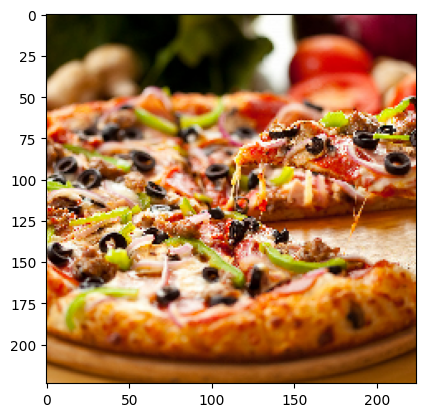

In [ ]:
steak_prediction = model_10.predict(train_data)
print(steak_prediction)
images, labels = train_data.next()
plt.imshow(images[0]);
labels

## Unbatch

In [ ]:
# Get a sample of a train data batch
steak, steak_prediction = train_data.next() # Get the next batch of images/labels in train_data

In [ ]:
def process_and_plot(model, filename, img_shape=224):
  train_datagen = ImageDataGenerator(rescale=1/255.)

  # Create non-augmented trained data batches
  print("Non-augmented training data:")
  train_data = train_datagen.flow_from_directory(filename,
                                                target_size=(img_shape, img_shape)) 
  # Make prediction
  prediction = model.predict(train_data)

  # Get a sample of a train data batch
  images, labels = train_data.next()

  # Plot image + label
  show_batches_images(images, prediction)

Non-augmented training data:
Found 4 images belonging to 3 classes.
1/1 [==============================] - 0s 396ms/step
Showing image number:3
Showing image number:2


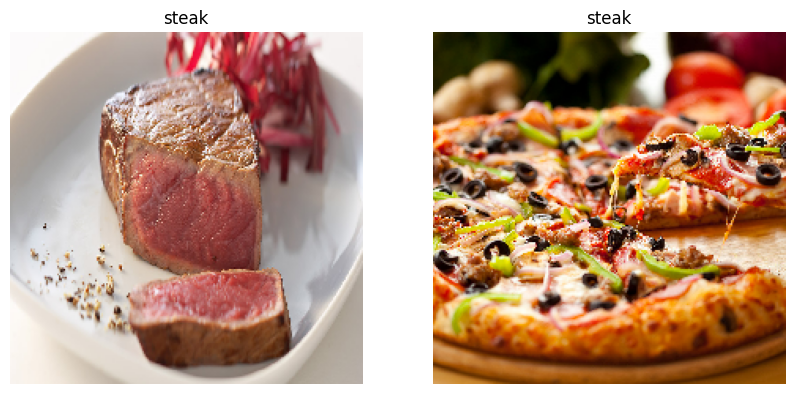

In [ ]:
process_and_plot(model_10, "drive/MyDrive/pizza_steak")

In [ ]:
# Make it a function
def load_and_prep_image(filename, img_shape=224):
  """
  Read an image from filename, turns it into a tensor and reshapes it to (img_shape, img_shape, color_channels). 
  """
  # Read in the image 
  img = tf.io.read_file(filename)
  # Decode the read file into a tensor
  img = tf.image.decode_image(img)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  # Rescale the image (get all value between 0 and 1)
  img = img/255.
  # add a dim
  img = tf.expand_dims(img, axis=0)
  return img

In [ ]:
# Load in and preprocess our custom image
steak = load_and_prep_image("03-steak.jpeg")
steak

<tf.Tensor: shape=(1, 224, 224, 3), dtype=float32, numpy=
array([[[[0.6377451 , 0.6220588 , 0.57892156],
         [0.6504902 , 0.63186276, 0.5897059 ],
         [0.63186276, 0.60833335, 0.5612745 ],
         ...,
         [0.52156866, 0.05098039, 0.09019608],
         [0.49509802, 0.04215686, 0.07058824],
         [0.52843136, 0.07745098, 0.10490196]],

        [[0.6617647 , 0.6460784 , 0.6107843 ],
         [0.6387255 , 0.6230392 , 0.57598037],
         [0.65588236, 0.63235295, 0.5852941 ],
         ...,
         [0.5352941 , 0.06862745, 0.09215686],
         [0.529902  , 0.05931373, 0.09460784],
         [0.5142157 , 0.05539216, 0.08676471]],

        [[0.6519608 , 0.6362745 , 0.5892157 ],
         [0.6392157 , 0.6137255 , 0.56764704],
         [0.65637255, 0.6269608 , 0.5828431 ],
         ...,
         [0.53137255, 0.06470589, 0.08039216],
         [0.527451  , 0.06862745, 0.1       ],
         [0.52254903, 0.05196078, 0.0872549 ]],

        ...,

        [[0.49313724, 0.42745098, 

In [ ]:
pred = model_10.predict(steak)

1/1 [==============================] - 0s 316ms/step


Looks like our custom image is being put through our model, however, it currently outputs a prediction probability, wouldn't it be nice if we could visualize image as well as model's prediction.

In [ ]:
pred_class = class_names[int(tf.round(pred))]
pred_class

'steak'

In [ ]:
class_names = []

In [ ]:
def pred_and_plot(model, filename, class_names=class_names):
  """
  Import an image located at filename, makes a prediction with model and plots the image with the predicated class as the title
  """
  # Import the targeted image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(img)

  # Squeeze it
  img = tf.squeeze(img)

  # Get the predicted class
  if (len(pred[0]) == 1):
    pred_class = class_names[int(tf.round(pred))]
  else:
    pred_class = class_names[pred.argmax()]

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction:{pred_class}")
  plt.axis(False);

1/1 [==============================] - 0s 29ms/step


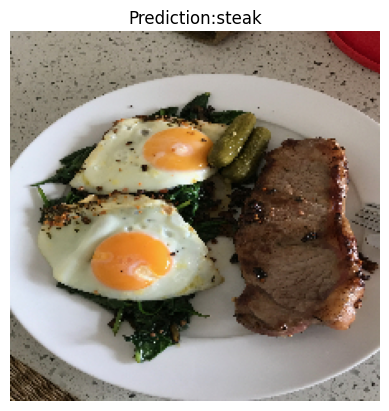

In [ ]:
# Test our model on a custom image
pred_and_plot(model_10, "03-steak.jpeg")

In [ ]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg

--2023-04-29 08:17:57--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg’

03-pizza-dad.jpeg   100%[===================>]   2.74M  --.-KB/s    in 0.02s   

2023-04-29 08:17:57 (116 MB/s) - ‘03-pizza-dad.jpeg’ saved [2874848/2874848]



Non-augmented training data:
Found 4 images belonging to 3 classes.
1/1 [==============================] - 1s 668ms/step
Showing image number:0
Showing image number:1


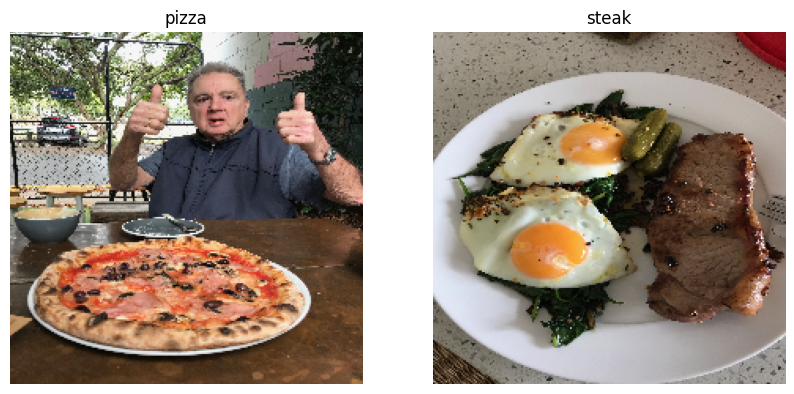

In [ ]:
process_and_plot(model_10, "drive/MyDrive/pizza_steak")

1/1 [==============================] - 0s 25ms/step


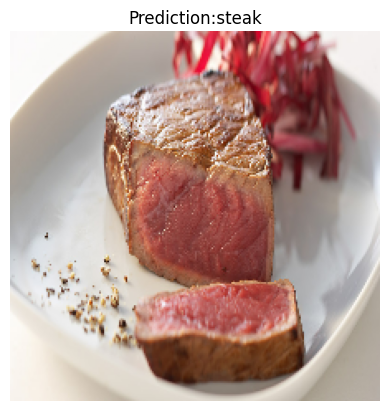

In [ ]:
pred_and_plot(model_10, "/content/drive/MyDrive/pizza_steak/custom/steak-boeuf-cuisson.jpg")

## Multi-class Image Classification

We've just been through a bunch of the following steps with a binary classifiaction problem (pizza vs. steak), now we're going step things up a notch with 10 classes of food (multi-class classification).  

1. Become one with the data
2. Preprocess the data (get it ready for a model)
3. Create a model (start with a baseline)
4. Fit the model (overfit it to make sure it works)
5. Evaluate the model
6. Adjust different hyperparameters and improve the model (try to beat baseline/reduce overfitting)
7. Repeat until satisfied

## 1. Import and become one the data

In [ ]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip

# Unzip our data 
zip_ref = zipfile.ZipFile("10_food_classes_all_data.zip", "r")
zip_ref.extractall()
zip_ref.close()

--2023-04-29 12:15:47--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.23.128, 74.125.203.128, 74.125.204.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.23.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  30.3MB/s    in 17s     

2023-04-29 12:16:05 (28.5 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [ ]:
import os

# Walk trough 10 classes of image data
for dirpath, dirnames, filesnames in os.walk("10_food_classes_all_data"):
  print(f"There are {len(dirnames)} directories and {len(filesnames)} images in '{dirpath}'.")


There are 2 directories and 0 images in '10_food_classes_all_data'.
There are 10 directories and 0 images in '10_food_classes_all_data/train'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/chicken_curry'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/fried_rice'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/chicken_wings'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/ice_cream'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/grilled_salmon'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/ramen'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/hamburger'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/steak'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/pizza'.
There are 0 directories and 750 images in '10_food_classes_all_data/train/sushi'.

In [ ]:
# Setup the train and test directories
train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

In [ ]:
# Let's get the class names
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


['57672.jpg']
Image shape: (379, 512, 3)


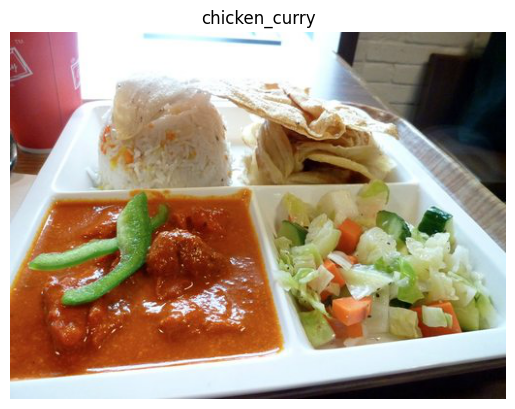

In [ ]:
# Visualize
import random
img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names)
                        )

###  2. Preprocess the data (prepare it for a model)

In [ ]:
from numpy.ma.core import reshape
# Create, train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Create ImageDataGenerator training instance with data augmentation 
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=0.2,
                                             shear_range=0.4,
                                             zoom_range=0.1,
                                             width_shift_range=0.2,
                                             height_shift_range=0.3,
                                             horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1/255.)

In [ ]:
train_data = train_datagen_augmented.flow_from_directory(train_dir,
                                                         target_size=(224, 224))

test_data = test_datagen.flow_from_directory(test_dir,
                                              target_size=(224, 224))

Found 7500 images belonging to 10 classes.
Found 7500 images belonging to 10 classes.


Showing image number:16
Showing image number:1


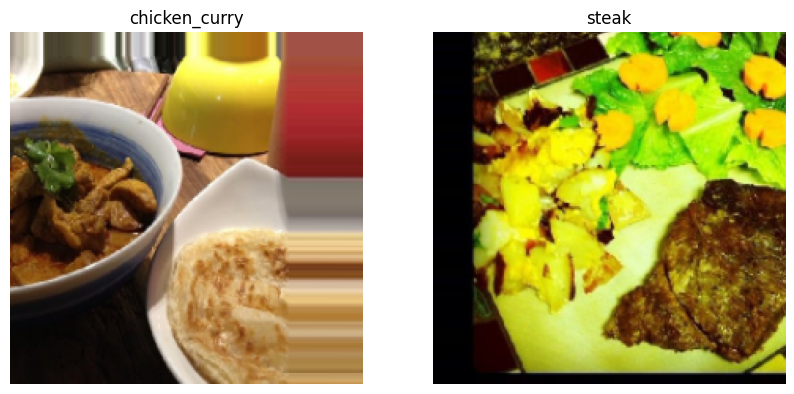

In [ ]:
# Visualize our data
images, labels = train_data.next()
show_batches_images(images, labels)

### 3. Create a model (start with a baseline)

We've been talking a lot about CNN explainer website...
How about we just take their model (also on 10 classes and use it for our problem)

In [ ]:
# Create a model

model_11 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(10, activation="softmax")
])

# Compile it

model_11.compile(loss="categorical_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

# Fit it

history_11 = model_11.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data)

Epoch 1/5
235/235 [==============================] - 912s 4s/step - loss: 2.3040 - accuracy: 0.1171 - val_loss: 2.2593 - val_accuracy: 0.1797
Epoch 2/5
235/235 [==============================] - 990s 4s/step - loss: 2.2059 - accuracy: 0.1865 - val_loss: 2.0989 - val_accuracy: 0.2500
Epoch 3/5
235/235 [==============================] - 1055s 4s/step - loss: 2.1256 - accuracy: 0.2315 - val_loss: 2.0027 - val_accuracy: 0.3019
Epoch 4/5
235/235 [==============================] - 1080s 5s/step - loss: 2.0544 - accuracy: 0.2707 - val_loss: 1.9566 - val_accuracy: 0.3192
Epoch 5/5
235/235 [==============================] - 894s 4s/step - loss: 1.9928 - accuracy: 0.3037 - val_loss: 1.8345 - val_accuracy: 0.3680


In [ ]:
save_model(model_11, "model_11")

Saving model to: /content/drive/MyDrive/pizza_steak/save/29042023-154213-model_11.h5...


'/content/drive/MyDrive/pizza_steak/save/29042023-154213-model_11.h5'

### 5. Evaluate the model 

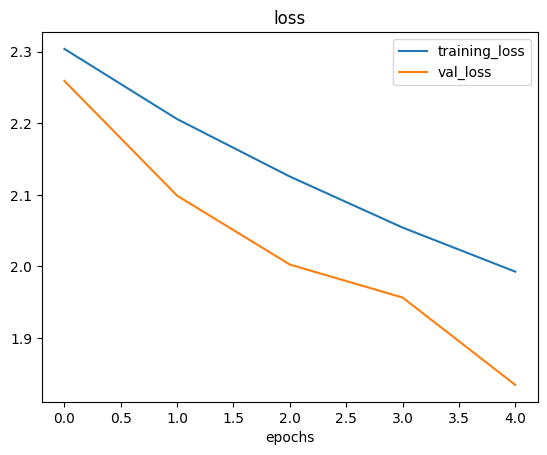

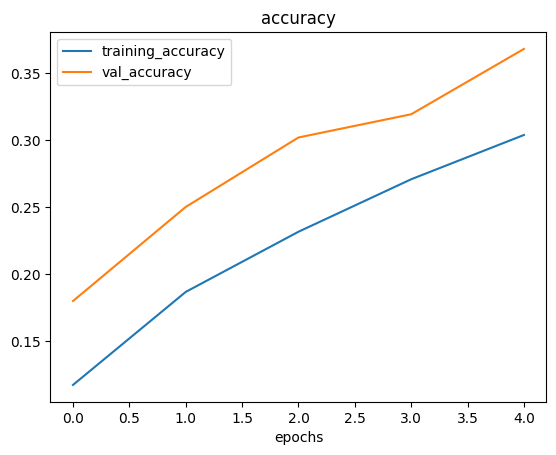

In [ ]:
plot_loss_curves(history_11)

What does these loss curves tell us ?

Well... it seems our model is **overfitting** the training set quite badly... in other words, it's getting great results on the training data but fails to generalize on test data.

In [ ]:
model_11.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

### 6. Adjust the model hyperparameters (to beat the baseline/reduce overfitting) 

Due to its performance on the training data, it's clear our model is learning something... 

However, it's not generalizing ell to unseen data.

So, let's try and fix overfitting by:

* **Get more data** - having more data gives a model more opportunity to learn diverse patterns...
* **Simplify the model** - if our current model is overfitting the data, it may be too complicated of a model is to: reduce # of layers or reduce # of hidden units in layers.
* **Use data augmentation** - data augmentation manipulates the training data in such a way to add more diversity to it (without altering the original data)
* **Use transfer learning** - transfer learning leverages the patterns another model has learned on similar data to your own and allows you to use those patterns on your own dataset.

In [ ]:
# # How about we try and simplify the model first ?
# # Let's try to remove 2 convolutional layers...

# model_12 = Sequential([
#     Conv2D(10, 3, activation="relu"),
#     MaxPool2D(),
#     Conv2D(10, 3, activation="relu"),
#     MaxPool2D(),
#     Flatten(),
#     Dense(10, activation="softmax")
# ])

# model_12.compile(loss="categorical_crossentropy",
#                  optimizer=Adam(),
#                  metrics=["accuracy"])

In [ ]:
# # Fit the model with 2 conv layers removed
# history_12 = model_12.fit(train_data,
#              epochs=5,
#              steps_per_epoch=len(train_data),
#              validation_data=test_data,
#              validation_steps=(0.25 * len(test_data))

In [ ]:
# Clone a model
model_12 = tf.keras.models.clone_model(model_11)
# keep the layers but not the patterns

In [ ]:
model_12.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

### 7. Repeat until satisfied

We can improve the accuracy using some of these tips:

* By running a lots of experiments, namely:
- restructuring our model's architecture (increasing layers/ hidden units)
- adjust the learning rate
- try differents methods of data augmentation (adjust the hyperparameters in our ImageDataGenerator instance)
- training for longer (10 epochs instead of 5).
- **try transfer learning**

### Making a prediction with our trained model

Let's use our trained model to make some prediction on our own custom images!

In [ ]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [ ]:
# Download some custom images
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-sushi.jpeg

--2023-04-29 14:08:11--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg’

03-pizza-dad.jpeg   100%[===================>]   2.74M  --.-KB/s    in 0.1s    

2023-04-29 14:08:12 (24.2 MB/s) - ‘03-pizza-dad.jpeg’ saved [2874848/2874848]

--2023-04-29 14:08:12--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting

1/1 [==============================] - 0s 41ms/step


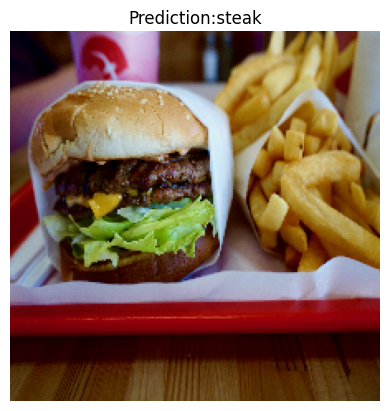

In [ ]:
# Make a prediction using model_11
pred_and_plot(model_11, "/content/drive/MyDrive/pizza_steak/custom/03-hamburger.jpeg")

Non-augmented training data:
Found 6 images belonging to 3 classes.
1/1 [==============================] - 2s 2s/step
Showing image number:0
Showing image number:3


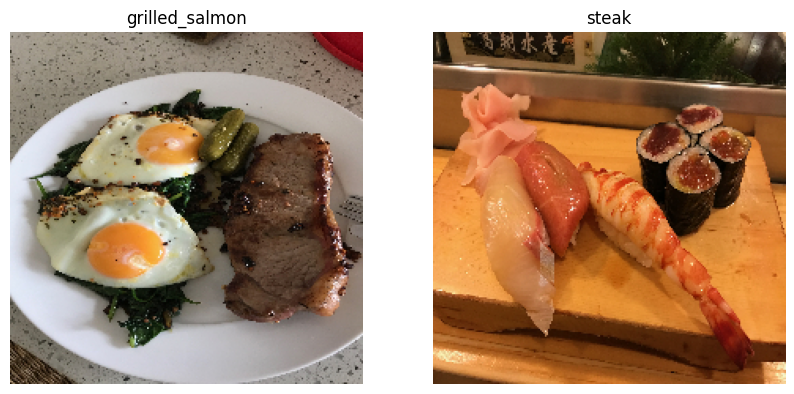

In [ ]:
process_and_plot(model_11, "drive/MyDrive/pizza_steak")

Looks like our model didn't performs very well on our custom images but this is because it only achieved ~37% accuracy on the test data.
So we can expect it to function quite poorly on unseen data.

In [ ]:
model_13 = load_model("/content/drive/MyDrive/pizza_steak/save/29042023-154213-model_11.h5")

Loading saved model from: /content/drive/MyDrive/pizza_steak/save/29042023-154213-model_11.h5


In [ ]:
# Compare loaded model to our existing model
model_13.evaluate(test_data)

235/235 [==============================] - 228s 968ms/step - loss: 1.8345 - accuracy: 0.3680


[1.834485650062561, 0.36800000071525574]

In [ ]:
model_11.evaluate(test_data)

### 🛠 03. Computer vision & convolutional neural networks in TensorFlow Exercises

1. Spend 20-minutes reading and interacting with the [CNN explainer website](https://poloclub.github.io/cnn-explainer/). 
 * What are the key terms? e.g. explain convolution in your own words, pooling in your own words
2. Play around with the "understanding hyperparameters" section in the [CNN explainer](https://poloclub.github.io/cnn-explainer/) website for 10-minutes.
  * What is the kernel size?
  * What is the stride? 
  * How could you adjust each of these in TensorFlow code?
3. Take 10 photos of two different things and build your own CNN image classifier using the techniques we've built here.
4. Find an ideal learning rate for a simple convolutional neural network model on your the 10 class dataset.

## Create our own dataset



In [ ]:
import os

# Walk trough 10 classes of image data
for dirpath, dirnames, filesnames in os.walk("drive/MyDrive/trees"):
  print(f"There are {len(dirnames)} directories and {len(filesnames)} images in '{dirpath}'.")

There are 3 directories and 0 images in 'drive/MyDrive/trees'.
There are 0 directories and 0 images in 'drive/MyDrive/trees/.ipynb_checkpoints'.
There are 2 directories and 0 images in 'drive/MyDrive/trees/test'.
There are 0 directories and 5 images in 'drive/MyDrive/trees/test/sapins'.
There are 0 directories and 5 images in 'drive/MyDrive/trees/test/palmiers'.
There are 3 directories and 0 images in 'drive/MyDrive/trees/train'.
There are 0 directories and 10 images in 'drive/MyDrive/trees/train/sapins'.
There are 0 directories and 0 images in 'drive/MyDrive/trees/train/.ipynb_checkpoints'.
There are 0 directories and 10 images in 'drive/MyDrive/trees/train/palmiers'.


In [ ]:
# Setup the train and test directories
train_dir = "drive/MyDrive/trees/train/"
test_dir = "drive/MyDrive/trees/test/"

In [ ]:
# Let's get the class names
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['palmiers' 'sapins']


In [ ]:
# Let's visualize our images

def view_random_image(target_dir, target_class):
  # Setup the target directory (we'll view images from here)
  target_folder = target_dir + "/" + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1) # Randomly sample one the item here, return a list of one image, image name
  print(random_image)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + "/" + random_image[0]) # return un tableau numpy de l'image
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")

  print(f"Image shape: {img.shape}")

  

['Palmier-forunei-petit-zoom.jpg']
Image shape: (1200, 800, 3)


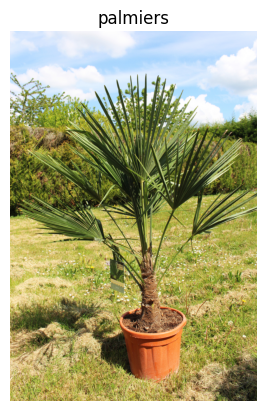

In [ ]:
view_random_image("drive/MyDrive/trees/train", random.choice(class_names))

###  Preprocess the data custom and turn it into batches

In [ ]:
from numpy.ma.core import reshape
# Create, train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Create ImageDataGenerator training instance with data augmentation 
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=0.1,
                                             shear_range=0.2,
                                             zoom_range=0.1,
                                             width_shift_range=0.4,
                                             height_shift_range=0.3,
                                             horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1/255.)

train_data = train_datagen_augmented.flow_from_directory(train_dir,
                                                         target_size=(224, 224),
                                                         class_mode="binary")

test_data = test_datagen.flow_from_directory(test_dir,
                                              target_size=(224, 224),
                                              class_mode="binary")

Found 20 images belonging to 2 classes.
Found 10 images belonging to 2 classes.


## Visualize data

In [ ]:
import matplotlib.pyplot as plt
import random

In [ ]:
# Visualize data
import matplotlib.pyplot as plt
import random
# Create a function for viewing images in a data batch
def show_batches_images(images, labels, augmented_images=None, augmented_label=None):
  """
  Displays a plot of random images and their labels from a data batch.
  """
  i = random.choice(range(len(images)))
  j = random.choice(range(len(images)))
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Create subplots (5 rows, 5 columns)
  plt.subplot(1, 2, 1)
  # Display an image
  plt.imshow(images[i])
  print("Showing image number:{}".format(i))
  # Add the image label as the title
  if labels.ndim == 1:
    plt.title(class_names[int(tf.round(labels[i]))])
  else:
    plt.title(class_names[labels[i].argmax()])
  # Turn the grid lines off
  plt.axis("off")
  # Create subplots (5 rows, 5 columns)
  plt.subplot(1, 2, 2)
  # Display an image
  plt.imshow(images[j])
  print("Showing image number:{}".format(j))
  # Add the image label as the title
  if labels.ndim == 1:
    plt.title(class_names[int(tf.round(labels[j]))])
  else:
    plt.title(class_names[labels[j].argmax()])
  # Turn the grid lines off
  plt.axis("off")

  if (augmented_images is not None):
    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Create subplots (5 rows, 5 columns)
    plt.subplot(1, 2, 1)
    # Display an image
    plt.imshow(augmented_images[i])
    print("Showing augmented image number:{}".format(i))
    # Add the image label as the title
    if labels.ndim == 1:
      plt.title(class_names[int(tf.round(augmented_labels[i]))])
    else:
      plt.title(class_names[augmented_labels[i].argmax()])
      # Turn the grid lines off
      plt.axis("off")
      # Create subplots (5 rows, 5 columns)
      plt.subplot(1, 2, 2)
      # Display an image
      plt.imshow(augmented_images[j])
      print("Showing augmented image number:{}".format(j))
      # Add the image label as the title
    if labels.ndim == 1:
      plt.title(class_names[int(tf.round(augmented_labels[j]))])
    else:
      plt.title(class_names[augmented_labels[j].argmax()])
      # Turn the grid lines off
      plt.axis("off")

In [ ]:
# Unbatch train_data
images, labels = train_data.next()

In [ ]:
labels.ndim

1

Showing image number:14
Showing image number:1


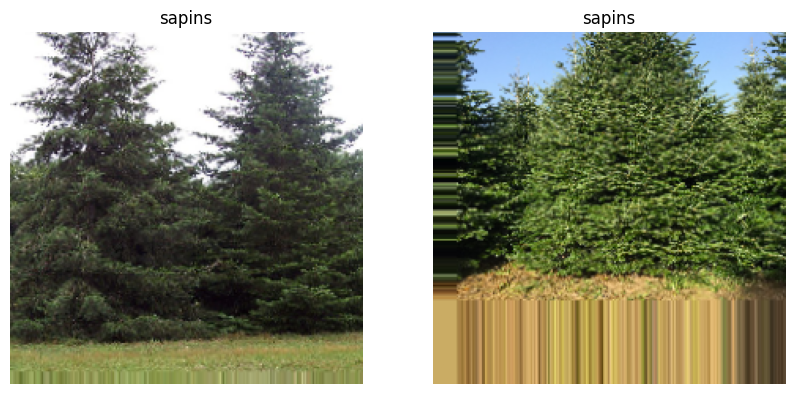

In [ ]:
show_batches_images(images, labels)

## Create a model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense

In [ ]:
from tensorflow._api.v2.config import optimizer
# Create a model
model_13 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_13.compile(loss="binary_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

history_13 = model_13.fit(train_data,
                          epochs=20,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data))

Epoch 1/20
1/1 [==============================] - 8s 8s/step - loss: 0.6954 - accuracy: 0.5000 - val_loss: 0.9864 - val_accuracy: 0.5000
Epoch 2/20
1/1 [==============================] - 8s 8s/step - loss: 0.9016 - accuracy: 0.5000 - val_loss: 0.6766 - val_accuracy: 0.7000
Epoch 3/20
1/1 [==============================] - 5s 5s/step - loss: 0.6726 - accuracy: 0.8000 - val_loss: 0.7025 - val_accuracy: 0.5000
Epoch 4/20
1/1 [==============================] - 7s 7s/step - loss: 0.7035 - accuracy: 0.5000 - val_loss: 0.7073 - val_accuracy: 0.5000
Epoch 5/20
1/1 [==============================] - 6s 6s/step - loss: 0.6916 - accuracy: 0.5000 - val_loss: 0.7077 - val_accuracy: 0.5000
Epoch 6/20
1/1 [==============================] - 8s 8s/step - loss: 0.6748 - accuracy: 0.5000 - val_loss: 0.7044 - val_accuracy: 0.5000
Epoch 7/20
1/1 [==============================] - 5s 5s/step - loss: 0.6666 - accuracy: 0.5000 - val_loss: 0.7017 - val_accuracy: 0.5000
Epoch 8/20
1/1 [=========================

## Evaluate the model

In [ ]:
!git clone https://github.com/JoachimLombardi/Helper_functions.git

fatal: destination path 'Helper_functions' already exists and is not an empty directory.


In [ ]:
from Helper_functions.plot_loss_curves import plot_loss_curves

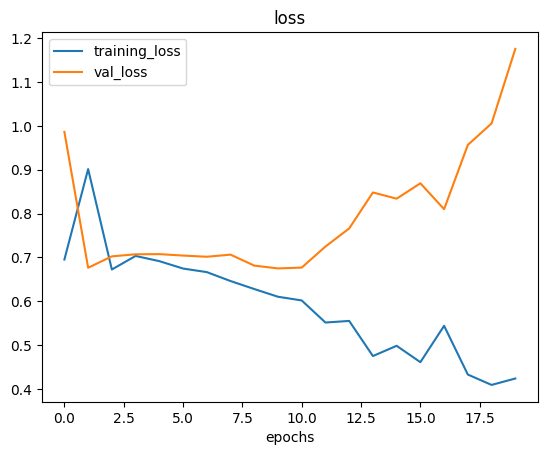

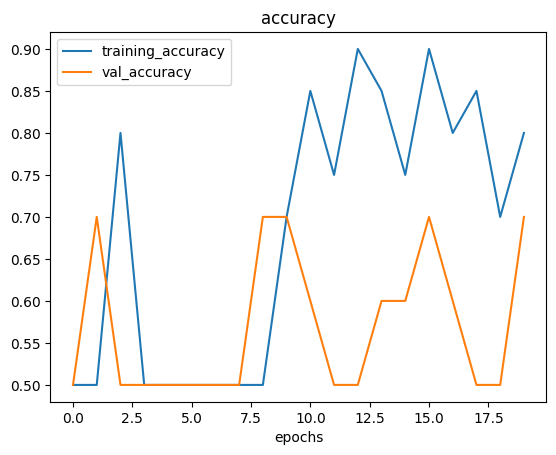

In [ ]:
plot_loss_curves(history_13)

In [ ]:
# We can clerly see an overfitting form the 10th epochs, let's try with another augmentation. 
# Create ImageDataGenerator training instance with data augmentation 
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=0.2,
                                             shear_range=0.3,
                                             zoom_range=0.2,
                                             width_shift_range=0.4,
                                             height_shift_range=0.3,
                                             horizontal_flip=True)

train_data = train_datagen_augmented.flow_from_directory(train_dir,
                                                         target_size=(224, 224),
                                                         class_mode="binary")

Found 20 images belonging to 2 classes.


In [ ]:
from tensorflow._api.v2.config import optimizer
# Create a model
model_14 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_14.compile(loss="binary_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

history_14 = model_14.fit(train_data,
                          epochs=20,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data))

Epoch 1/20
1/1 [==============================] - 10s 10s/step - loss: 0.6967 - accuracy: 0.4000 - val_loss: 1.3331 - val_accuracy: 0.5000
Epoch 2/20
1/1 [==============================] - 6s 6s/step - loss: 1.1394 - accuracy: 0.5000 - val_loss: 0.7750 - val_accuracy: 0.5000
Epoch 3/20
1/1 [==============================] - 8s 8s/step - loss: 0.7603 - accuracy: 0.5000 - val_loss: 0.8060 - val_accuracy: 0.5000
Epoch 4/20
1/1 [==============================] - 6s 6s/step - loss: 0.8001 - accuracy: 0.5000 - val_loss: 0.7177 - val_accuracy: 0.5000
Epoch 5/20
1/1 [==============================] - 8s 8s/step - loss: 0.7070 - accuracy: 0.5000 - val_loss: 0.6863 - val_accuracy: 0.5000
Epoch 6/20
1/1 [==============================] - 5s 5s/step - loss: 0.6820 - accuracy: 0.5000 - val_loss: 0.6797 - val_accuracy: 0.7000
Epoch 7/20
1/1 [==============================] - 14s 14s/step - loss: 0.6733 - accuracy: 0.8000 - val_loss: 0.6773 - val_accuracy: 0.6000
Epoch 8/20
1/1 [=====================

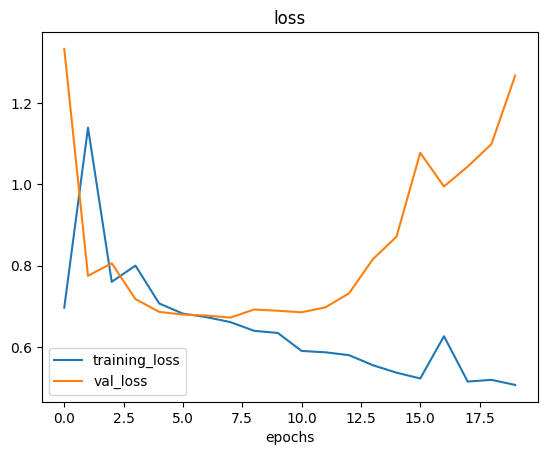

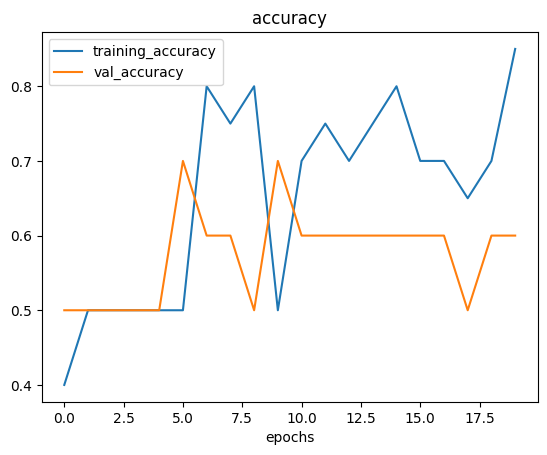

In [ ]:
plot_loss_curves(history_14)

In [ ]:
# not better let's try to decreases conv2D
# Create a model
model_15 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_15.compile(loss="binary_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

history_15 = model_15.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data))

Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 0.6911 - accuracy: 0.5000 - val_loss: 0.6891 - val_accuracy: 0.5000
Epoch 2/10
1/1 [==============================] - 3s 3s/step - loss: 0.6895 - accuracy: 0.5000 - val_loss: 0.6906 - val_accuracy: 0.5000
Epoch 3/10
1/1 [==============================] - 3s 3s/step - loss: 0.6875 - accuracy: 0.5000 - val_loss: 0.6909 - val_accuracy: 0.5000
Epoch 4/10
1/1 [==============================] - 3s 3s/step - loss: 0.6909 - accuracy: 0.5000 - val_loss: 0.6913 - val_accuracy: 0.5000
Epoch 5/10
1/1 [==============================] - 5s 5s/step - loss: 0.6883 - accuracy: 0.5000 - val_loss: 0.6917 - val_accuracy: 0.5000
Epoch 6/10
1/1 [==============================] - 3s 3s/step - loss: 0.6899 - accuracy: 0.5000 - val_loss: 0.6918 - val_accuracy: 0.5000
Epoch 7/10
1/1 [==============================] - 3s 3s/step - loss: 0.6817 - accuracy: 0.5000 - val_loss: 0.6918 - val_accuracy: 0.5000
Epoch 8/10
1/1 [=========================

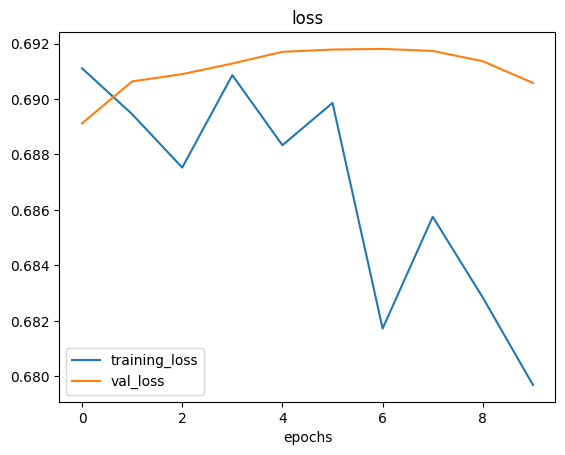

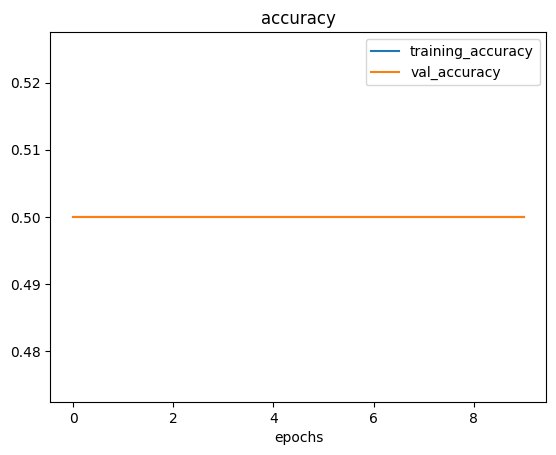

In [ ]:
plot_loss_curves(history_15)

In [ ]:
#Not good results at all it is like guessing, I think it is because of the poorness of the number of images

In [ ]:
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20))

model_16 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_16.compile(loss="binary_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

history_16 = model_16.fit(train_data,
                          epochs=100,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data),
                          callbacks=[lr_scheduler])

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.6964 - accuracy: 0.5000 - val_loss: 0.6903 - val_accuracy: 0.5000 - lr: 1.0000e-04
Epoch 2/100
1/1 [==============================] - 9s 9s/step - loss: 0.6860 - accuracy: 0.5000 - val_loss: 0.6988 - val_accuracy: 0.5000 - lr: 1.1220e-04
Epoch 3/100
1/1 [==============================] - 5s 5s/step - loss: 0.6839 - accuracy: 0.5000 - val_loss: 0.7016 - val_accuracy: 0.5000 - lr: 1.2589e-04
Epoch 4/100
1/1 [==============================] - 7s 7s/step - loss: 0.6815 - accuracy: 0.5000 - val_loss: 0.6944 - val_accuracy: 0.5000 - lr: 1.4125e-04
Epoch 5/100
1/1 [==============================] - 6s 6s/step - loss: 0.6832 - accuracy: 0.5000 - val_loss: 0.6862 - val_accuracy: 0.7000 - lr: 1.5849e-04
Epoch 6/100
1/1 [==============================] - 5s 5s/step - loss: 0.6718 - accuracy: 0.5500 - val_loss: 0.6810 - val_accuracy: 0.5000 - lr: 1.7783e-04
Epoch 7/100
1/1 [==============================] - 8s 8s/step - loss: 

Text(0.5, 1.0, 'Learning rate vs loss')

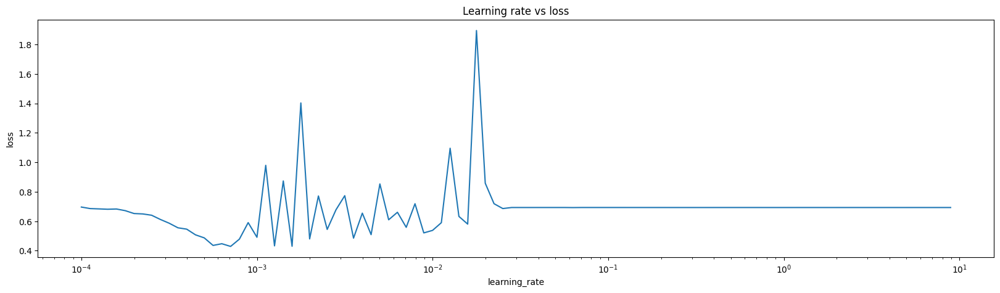

In [ ]:
# Plot the learning rate vs loss
plt.figure(figsize=(20, 5))
plt.semilogx(history_16.history["lr"],
             history_16.history["loss"])
plt.xlabel("learning_rate")
plt.ylabel("loss")
plt.title("Learning rate vs loss")    


In [ ]:
model_17 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(224, 224, 3)),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_17.compile(loss="binary_crossentropy",
                 optimizer=Adam(0.0005),
                 metrics=["accuracy"])

history_17 = model_17.fit(train_data,
                          epochs=20,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps= len(test_data))

Epoch 1/20
1/1 [==============================] - 7s 7s/step - loss: 0.6972 - accuracy: 0.5000 - val_loss: 1.3892 - val_accuracy: 0.5000
Epoch 2/20
1/1 [==============================] - 6s 6s/step - loss: 1.1496 - accuracy: 0.5000 - val_loss: 0.7644 - val_accuracy: 0.5000
Epoch 3/20
1/1 [==============================] - 8s 8s/step - loss: 0.6875 - accuracy: 0.5000 - val_loss: 0.7478 - val_accuracy: 0.5000
Epoch 4/20
1/1 [==============================] - 6s 6s/step - loss: 0.7345 - accuracy: 0.5000 - val_loss: 0.8041 - val_accuracy: 0.5000
Epoch 5/20
1/1 [==============================] - 8s 8s/step - loss: 0.7944 - accuracy: 0.5000 - val_loss: 0.7545 - val_accuracy: 0.5000
Epoch 6/20
1/1 [==============================] - 6s 6s/step - loss: 0.7123 - accuracy: 0.5000 - val_loss: 0.7049 - val_accuracy: 0.5000
Epoch 7/20
1/1 [==============================] - 8s 8s/step - loss: 0.6963 - accuracy: 0.5000 - val_loss: 0.6809 - val_accuracy: 0.6000
Epoch 8/20
1/1 [=========================

### 📖 03. Computer vision & convolutional neural networks in TensorFlow Extra-curriculum

* **Watch:** [MIT's Introduction to Deep Computer Vision](https://www.youtube.com/watch?v=uapdILWYTzE&list=PLtBw6njQRU-rwp5__7C0oIVt26ZgjG9NI&index=3&ab_channel=AlexanderAmini) lecture. This will give you a great intuition behind convolutional neural networks.
* **Watch:** Deep dive on [mini-batch gradient descent](https://youtu.be/-_4Zi8fCZO4) by deeplearning.ai. If you're still curious about why we use **batches** to train models, this technical overview covers many of the reasons why.
* **Read:** [CS231n Convolutional Neural Networks for Visual Recognition](https://cs231n.github.io/convolutional-networks/) class notes. This will give a very deep understanding of what's going on behind the scenes of the convolutional neural network architectures we're writing. 
* **Read:** ["A guide to convolution arithmetic for deep learning"](https://arxiv.org/pdf/1603.07285.pdf). This paper goes through all of the mathematics running behind the scenes of our convolutional layers.
* **Code practice:** [TensorFlow Data Augmentation Tutorial](https://www.tensorflow.org/tutorials/images/data_augmentation). For a more in-depth introduction on data augmentation with TensorFlow, spend an hour or two reading through this tutorial.

---